***Tutorial4: Task***

---



The task was to choose a pic from my laptop, create 40 images & save them in my laptop folder. So I just changed the path and stopped the loop after i icrement is greater then 40. Achieving the ultimate goal

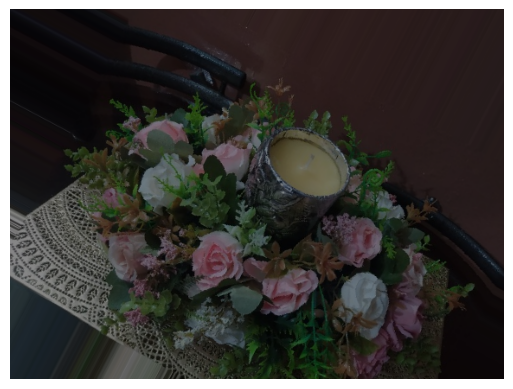

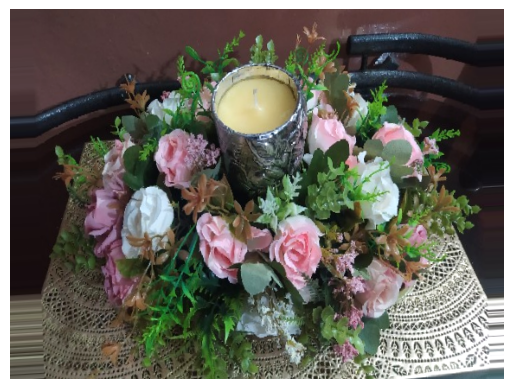

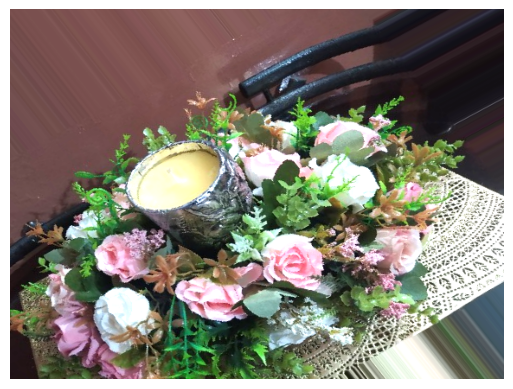

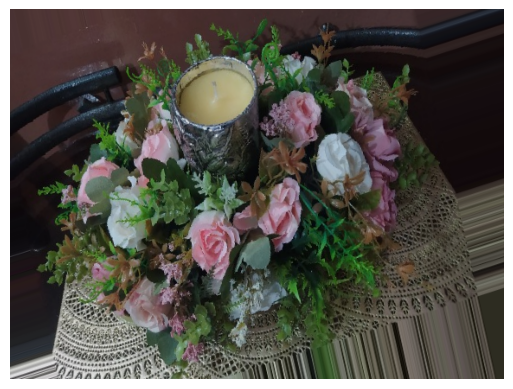

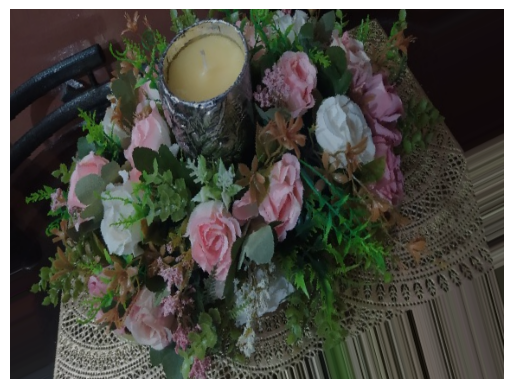

...

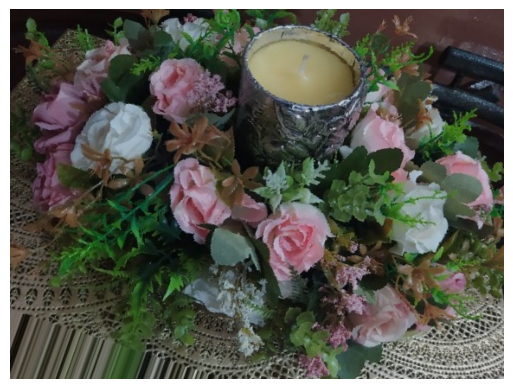

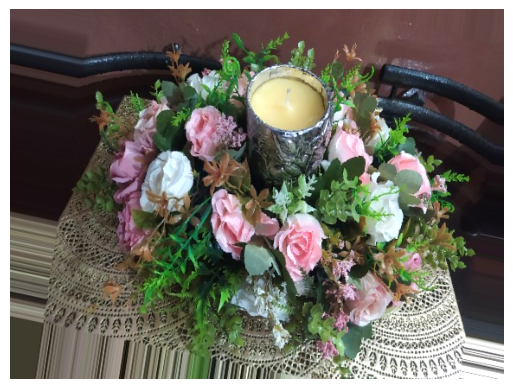

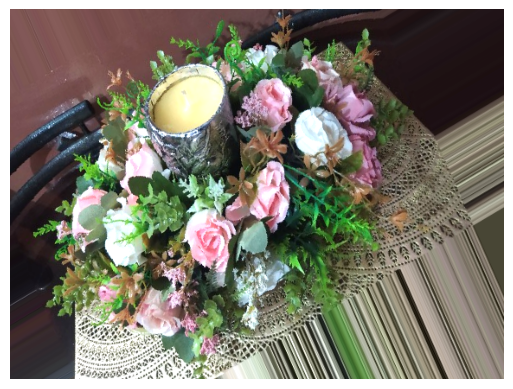

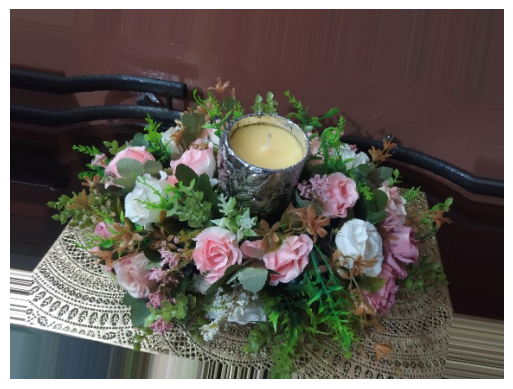

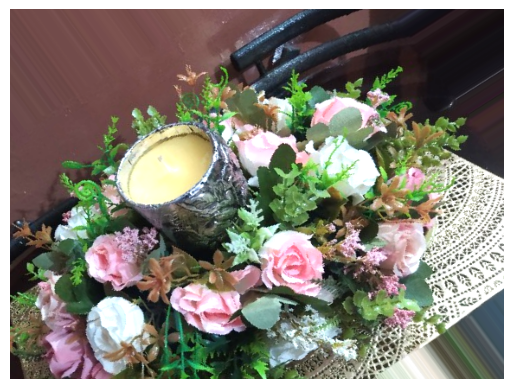

Augmented images are saved in the folder: /content/drive/MyDrive/Tutorial4IMAGES/Task.jpg


In [ ]:
'''Step 1 Importing Necessary Libraries'''

import matplotlib.pyplot as plt  # for displaying images
import numpy as np  # for numerical operations
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # for data augmentation
from tensorflow.keras.utils import load_img, img_to_array  # for loading and converting images to arrays
import os  # for creating directories and handling file system operations

'''Step 2 Define the folder where augmented images will be saved'''

save_folder = r"/content/drive/MyDrive/Tutorial4IMAGES/Task.jpg"


# Create the folder if it doesn't exist
if not os.path.exists(save_folder):
    os.makedirs(save_folder, exist_ok=True)

'''Step 3 Initialize the ImageDataGenerator class with augmentation parameters'''

datagen = ImageDataGenerator(
    rotation_range=40,  # randomly rotate images by up to 40 degrees
    shear_range=0.2,  # apply random shearing (distorting the image)
    zoom_range=0.2,  # randomly zoom in or out on the image by 20%
    horizontal_flip=True,  # Randomly flip images horizontally
    brightness_range=[0.5, 1.5]  # randomly adjust brightness between 50% and 150%
)

# Load the sample image from the given path
# Using os.path.join to create a platform-independent path
image_path = os.path.join("/content", "drive", "MyDrive", "Tutorial 4 IMAGES", "Task.jpg")
img = load_img(image_path)

# Convert the loaded image into a NumPy array
x = img_to_array(img)

# Reshape the image to add an extra dimension for batch processing
x = x.reshape((1,) + x.shape)

# Initialize a counter to limit the number of augmented images generated
i = 0

# Loop to generate and save augmented images
for batch in datagen.flow(x, batch_size=1,
                          save_to_dir=save_folder,  # Directory to save augmented images
                          save_prefix='aug',  # Prefix for saved image filenames
                          save_format='jpeg'):  # Format to save the images in
    # Convert the batch back to an image (for visualization)
    augmented_image = batch[0].astype('uint8')

    # Display the augmented image using matplotlib (optional)
    plt.figure(i)
    plt.imshow(augmented_image)  # Show the augmented image
    plt.axis('off')  # Hide axes
    plt.show()  # Display the visualization

    i += 1  # Increment the counter
    if i > 40:  # Stop after generating and saving 40 images
        break

print(f"Augmented images are saved in the folder: {os.path.abspath(save_folder)}")